# Machine Learning with Chemistry
# Project 1 : log P Regression

## 1. Data Generation & Data Preprocessing

In [132]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time
from rdkit import Chem
from rdkit.Chem import Descriptors
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import r2_score
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

In [9]:
# Read SMILES & logP csv File

logP_df = pd.read_csv('./data/logP.csv', header=None)

logP_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14000 entries, 0 to 13999
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   0       14000 non-null  object 
 1   1       14000 non-null  float64
dtypes: float64(1), object(1)
memory usage: 218.9+ KB


In [10]:
# Data type preprocessing

logP_data = logP_df.values

X_smiles = logP_data[:,0]
Y = logP_data[:,1].astype(float)

In [289]:
# Get molecular properties

id_molecule = []
for molecule in X_smiles:
    id_molecule.append(Chem.MolFromSmiles(molecule))

X = []
mol_properties = ['ExactMolWt', 'MaxPartialCharge', 'MinPartialCharge', 'NHOHCount', 'NOCount', 'NumHAcceptors', 'NumHDonors', 'NumHeteroatoms', 'NumValenceElectrons', 'RingCount', 'TPSA']
for idx in id_molecule:
    idx_properties = []
    for properties in mol_properties:
        idx_properties.append(getattr(Descriptors, properties)(idx))
    X.append(idx_properties)

X = np.array(X)
print(X.shape) # shape : m * n_mol_properties

Y = np.array(Y).reshape(-1,1)
print(Y.shape)

(14000, 11)
(14000, 1)


In [432]:
# Construct New dataframe w/ molecular properties

df = pd.DataFrame(np.concatenate((X,Y), axis=1), index=X_smiles, columns=(mol_properties + ['logP']))

print (df.info())

# Null-data Fill
df.fillna(0, inplace=True)
df['TPSA'].replace(0, df['TPSA'].mean(), inplace=True)

print (df.info())

# Save the Dataframe
df.to_excel('./data/molproperties.xlsx')

<class 'pandas.core.frame.DataFrame'>
Index: 14000 entries, C[C@H]([C@@H](C)Cl)Cl to [2H]C#CC([2H])([2H])Br
Data columns (total 12 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ExactMolWt           14000 non-null  float64
 1   MaxPartialCharge     13731 non-null  float64
 2   MinPartialCharge     13731 non-null  float64
 3   NHOHCount            14000 non-null  float64
 4   NOCount              14000 non-null  float64
 5   NumHAcceptors        14000 non-null  float64
 6   NumHDonors           14000 non-null  float64
 7   NumHeteroatoms       14000 non-null  float64
 8   NumValenceElectrons  14000 non-null  float64
 9   RingCount            14000 non-null  float64
 10  TPSA                 14000 non-null  float64
 11  logP                 14000 non-null  float64
dtypes: float64(12)
memory usage: 1.4+ MB
None
<class 'pandas.core.frame.DataFrame'>
Index: 14000 entries, C[C@H]([C@@H](C)Cl)Cl to [2H]C#CC([2H])([2H])Br
Data

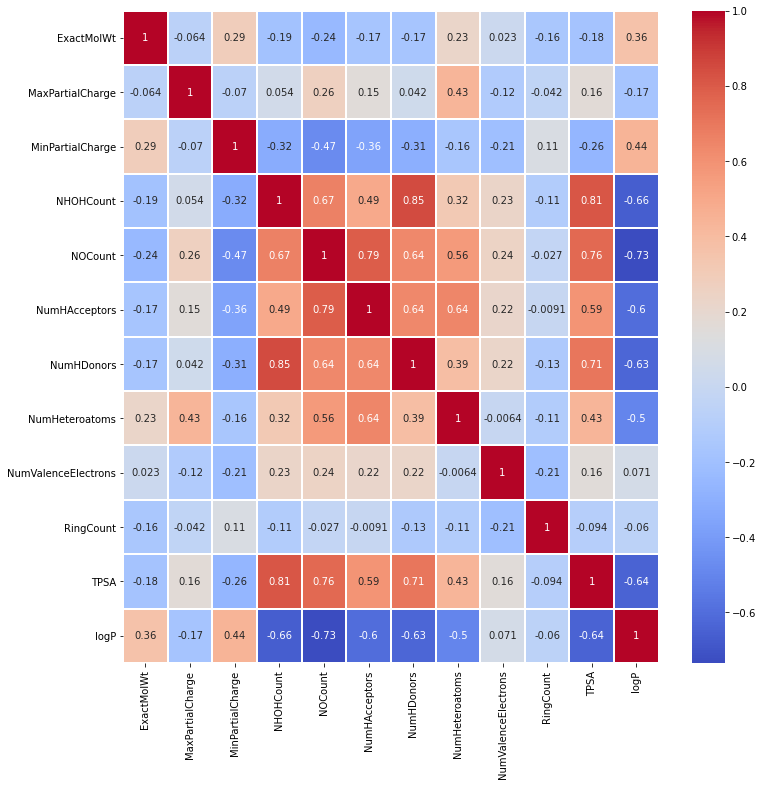

In [433]:
# View Heatmap

colormap = plt.cm.coolwarm
plt.figure(figsize=(12,12))

sns.heatmap(df.corr(), linewidths=0.1, vmax=1, cmap=colormap, linecolor='white', annot=True)
plt.show()

In [439]:
# Take Smiles index of Test Set

X_unscaled = df.iloc[:,:-1]
Y_unscaled = df.values[:,-1].reshape(-1,1)

X_train, X_test, Y_train, Y_test = train_test_split(X_unscaled, Y_scaled, test_size=0.2, random_state=0)

test_smiles = X_test.index

In [440]:
# Normalization, Torch Conversion, Train / Test data split

sc = MinMaxScaler(feature_range=(-1,1))
sc_val = MinMaxScaler(feature_range=(-1,1))
X_unscaled = sc.fit_transform(df.values[:,:-1])
Y_unscaled = sc_val.fit_transform(df.values[:,-1].reshape(-1,1))

X_train, X_test, Y_train, Y_test = train_test_split(X_scaled, Y_scaled, test_size=0.2, random_state=0)

X_trainset, X_testset = torch.FloatTensor(X_train), torch.FloatTensor(X_test)
Y_trainset, Y_testset = torch.FloatTensor(Y_train.reshape(-1)), torch.FloatTensor(Y_test.reshape(-1))
print (X_trainset.shape, Y_trainset.shape)

torch.Size([11200, 11]) torch.Size([11200])


In [441]:
# Dataset / Dataloader
batch_size = 10

train_dataset = torch.utils.data.TensorDataset(X_trainset, Y_trainset)
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_dataset = torch.utils.data.TensorDataset(X_testset, Y_testset)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)
test_individual_loader = torch.utils.data.DataLoader(test_dataset, batch_size=1, shuffle=False)

## 2. Simple FNN Model Generation

In [302]:
# Simple FNN w/ 2 Fully Connected Hidden Layer

class FNN(nn.Module):
    def __init__(self, input_dim):
        super(FNN, self).__init__()
        self.fc1 = nn.Linear(input_dim, 10)
        self.fc2 = nn.Linear(10, 10)
        self.fc3 = nn.Linear(10, 1)
        
    def forward(self, x):
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x.view(-1)

In [303]:
# Model Training

simpleNet = FNN(input_dim = len(mol_properties))
criterion = nn.MSELoss()
optimizer = optim.Adam(simpleNet.parameters())

epoch_num = 200
loss_train_epoch = []
loss_test_epoch = []

time_start = time.time()

for epoch in range(epoch_num):

    running_loss = 0.0

    simpleNet.train()
    for data in train_loader:
        inputs, labels = data
        optimizer.zero_grad()
        outputs = simpleNet(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * labels.shape[0]
    
    loss_train_epoch.append(running_loss/len(X_trainset))

    running_loss = 0.0

    simpleNet.eval()
    with torch.no_grad():
        for data in test_loader:
            inputs, labels = data
            outputs = simpleNet(inputs)
            loss = criterion(outputs, labels)

            running_loss += loss.item() * labels.shape[0]
    
    loss_test_epoch.append(running_loss/len(X_testset))

    print('Epoch [{}/{}]\tTrain loss: {:.4f}\tTest loss: {:.4f}'.format(epoch + 1, epoch_num, loss_train_epoch[-1], loss_test_epoch[-1]))


print ("\nTraining Finished, Time :", time.time()-time_start)

Epoch [1/200]	Train loss: 0.0203	Test loss: 0.0138
Epoch [2/200]	Train loss: 0.0127	Test loss: 0.0120
Epoch [3/200]	Train loss: 0.0117	Test loss: 0.0117
Epoch [4/200]	Train loss: 0.0114	Test loss: 0.0114
Epoch [5/200]	Train loss: 0.0111	Test loss: 0.0117
Epoch [6/200]	Train loss: 0.0109	Test loss: 0.0112
Epoch [7/200]	Train loss: 0.0108	Test loss: 0.0110
Epoch [8/200]	Train loss: 0.0106	Test loss: 0.0111
Epoch [9/200]	Train loss: 0.0105	Test loss: 0.0109
Epoch [10/200]	Train loss: 0.0104	Test loss: 0.0109
Epoch [11/200]	Train loss: 0.0104	Test loss: 0.0110
Epoch [12/200]	Train loss: 0.0103	Test loss: 0.0106
Epoch [13/200]	Train loss: 0.0102	Test loss: 0.0105
Epoch [14/200]	Train loss: 0.0102	Test loss: 0.0104
Epoch [15/200]	Train loss: 0.0101	Test loss: 0.0108
Epoch [16/200]	Train loss: 0.0099	Test loss: 0.0102
Epoch [17/200]	Train loss: 0.0099	Test loss: 0.0099
Epoch [18/200]	Train loss: 0.0098	Test loss: 0.0103
Epoch [19/200]	Train loss: 0.0097	Test loss: 0.0104
Epoch [20/200]	Train 

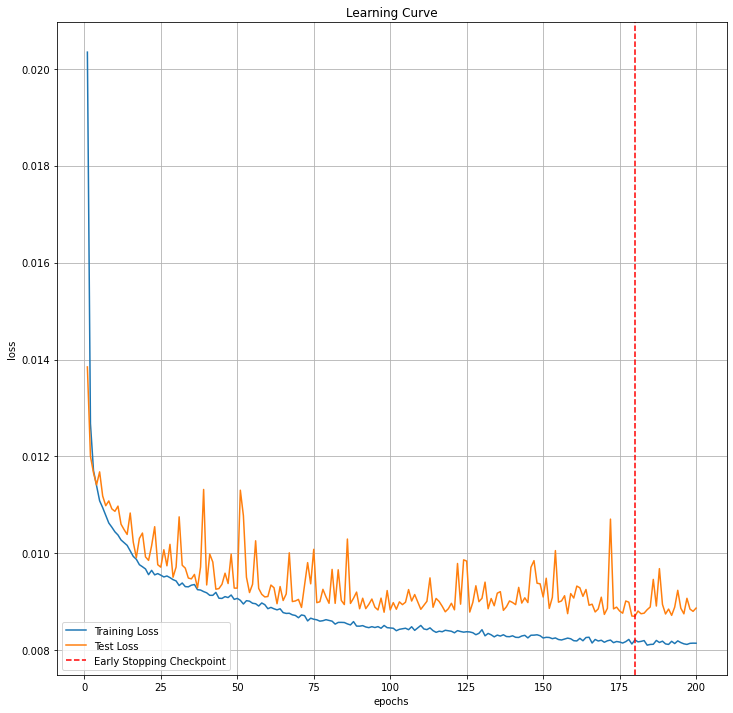

In [304]:
# Plot Learning Curve to check overfitting

plt.figure(figsize=(12,12))
plt.plot(range(1,epoch_num+1), loss_train_epoch, label='Training Loss')
plt.plot(range(1,epoch_num+1), loss_test_epoch, label='Test Loss')

min_val_loss = loss_test_epoch.index(min(loss_test_epoch)) + 1
plt.axvline(min_val_loss, linestyle='--', color='r', label='Early Stopping Checkpoint')

plt.title("Learning Curve")
plt.xlabel("epochs")
plt.ylabel("loss")
plt.grid(True)
plt.legend()
plt.show()

In [305]:
# Data Loading for Plot

with torch.no_grad():
    prediction = torch.Tensor([])
    Y_train_r2 = torch.Tensor([])
    running_loss = 0.0

    for data in train_loader:
        inputs, labels = data
        outputs = simpleNet(inputs)
        loss = criterion(outputs, labels)
        prediction = torch.cat([prediction, outputs], dim=0)
        Y_train_r2 = torch.cat([Y_train_r2, labels], dim=0)
        running_loss += loss.item() * labels.shape[0]

    prediction = prediction.view(-1,1).numpy()
    prediction_train = sc_val.inverse_transform(prediction)
    Y_train_r2 = sc_val.inverse_transform(Y_train_r2.reshape(-1,1))
    r2_train = r2_score(Y_train_r2, prediction_train.reshape(-1))
    loss_train =running_loss/len(X_trainset)

    print('Train MSE: {:.4f}\tTrain R2 score: {:.4f}'.format(loss_train, r2_train))


    prediction = torch.Tensor([])
    running_loss = 0.0
    for data in test_loader:
        inputs, labels = data
        outputs = simpleNet(inputs)
        loss = criterion(outputs, labels)
        prediction = torch.cat([prediction, outputs], dim=0)
        running_loss += loss.item() * labels.shape[0]

    prediction = prediction.view(-1,1).numpy()
    prediction_test = sc_val.inverse_transform(prediction)
    Y_test_r2 = sc_val.inverse_transform(Y_test)
    r2_test = r2_score(Y_test_r2, prediction_test.reshape(-1))
    loss_test =running_loss/len(X_testset)

    print('Test MSE: {:.4f}\tTest R2 score: {:.4f}'.format(loss_test, r2_test))

Train MSE: 0.0081	Train R2 score: 0.8850
Test MSE: 0.0089	Test R2 score: 0.8749


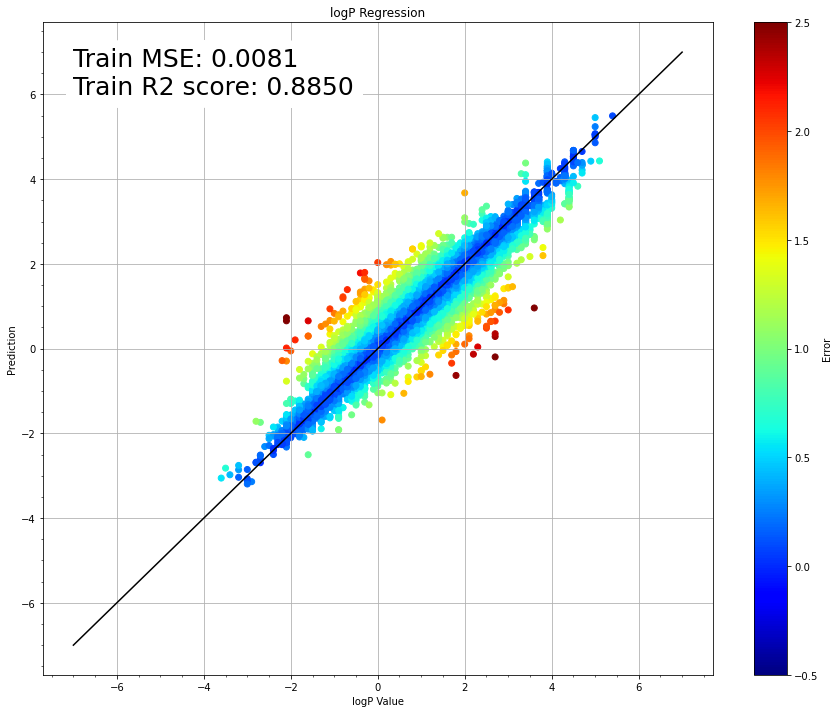

In [306]:
# Train Set Fitting

plt.figure(figsize=(15,12))

plt.plot([-7,7],[-7,7],color='black')
plt.scatter(Y_train_r2, prediction_train, c=np.abs(Y_train_r2 - prediction_train), vmax=2.5, vmin=-0.5, cmap='jet')
plt.colorbar(label='Error')

plt.title('logP Regression')
plt.xlabel('logP Value')
plt.ylabel('Prediction')

boxset = {'boxstyle':'square', 'ec':(1,1,1),'fc':(1,1,1), 'linestyle':'--', 'color':'black'}
plt.text(-7, 6, 'Train MSE: {:.4f}\nTrain R2 score: {:.4f}'.format(loss_train, r2_train), fontsize=25, bbox=boxset)

plt.grid(True)
plt.minorticks_on()

plt.show()

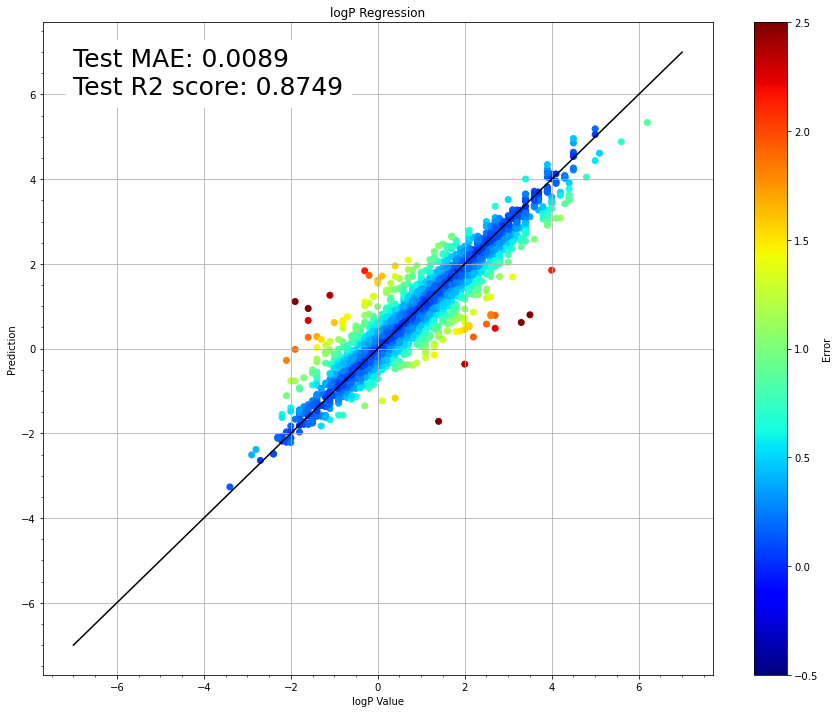

In [307]:
# Test Set Fitting

plt.figure(figsize=(15,12))

plt.plot([-7,7],[-7,7],color='black')
plt.scatter(Y_test_r2, prediction_test, c=np.abs(Y_test_r2 - prediction_test), vmax=2.5, vmin=-0.5, cmap='jet')
plt.colorbar(label='Error')

plt.title('logP Regression')
plt.xlabel('logP Value')
plt.ylabel('Prediction')

boxset = {'boxstyle':'square', 'ec':(1,1,1),'fc':(1,1,1), 'linestyle':'--', 'color':'black'}
plt.text(-7, 6, 'Test MAE: {:.4f}\nTest R2 score: {:.4f}'.format(loss_test, r2_test), fontsize=25, bbox=boxset)

plt.grid(True)
plt.minorticks_on()

plt.show()

## 3. Hyperparameter Tuning
### 1) Hidden Dimension

In [240]:
# Hyperparameter tuning : variable FNN w/ 2 Fully Connected Hidden Layer

class HyperFNN(nn.Module):
    def __init__(self, input_dim, hidden_dim):
        super(HyperFNN, self).__init__()
        self.fc1 = nn.Linear(input_dim, int(hidden_dim[0]))
        self.fc2 = nn.Linear(int(hidden_dim[0]), int(hidden_dim[1])) 
        self.fc3 = nn.Linear(int(hidden_dim[1]), 1)
        
    def forward(self, x):
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x.view(-1)

In [276]:
# Layer Dimension Tuning

iteration_set = [i for i in range(3,9)]
iteration_num = len(iteration_set)
hidden_dim_set = np.zeros((iteration_num, iteration_num, 2))
for i in range(iteration_num):
    for j in range(iteration_num):
        hidden_dim_set[i,j] = [2**(i+3), 2**(j+3)]

print(hidden_dim_set)

[[[  8.   8.]
  [  8.  16.]
  [  8.  32.]
  [  8.  64.]
  [  8. 128.]
  [  8. 256.]]

 [[ 16.   8.]
  [ 16.  16.]
  [ 16.  32.]
  [ 16.  64.]
  [ 16. 128.]
  [ 16. 256.]]

 [[ 32.   8.]
  [ 32.  16.]
  [ 32.  32.]
  [ 32.  64.]
  [ 32. 128.]
  [ 32. 256.]]

 [[ 64.   8.]
  [ 64.  16.]
  [ 64.  32.]
  [ 64.  64.]
  [ 64. 128.]
  [ 64. 256.]]

 [[128.   8.]
  [128.  16.]
  [128.  32.]
  [128.  64.]
  [128. 128.]
  [128. 256.]]

 [[256.   8.]
  [256.  16.]
  [256.  32.]
  [256.  64.]
  [256. 128.]
  [256. 256.]]]


In [308]:
# Model Training

loss_train_follow = [[0 for i in range(iteration_num)] for j in range(iteration_num)]
loss_train_hyper = np.zeros((iteration_num,iteration_num))
r2_train_hyper = np.zeros((iteration_num,iteration_num))

loss_test_follow = [[0 for i in range(iteration_num)] for j in range(iteration_num)]
loss_test_hyper = np.zeros((iteration_num,iteration_num))
r2_test_hyper = np.zeros((iteration_num,iteration_num))

time_start = time.time()

for i in range(iteration_num):
    for j in range(iteration_num):
        
        print ("\nTrain FNN with hidden layer dimension : {}".format(hidden_dim_set[i,j]))

        hyperNet = HyperFNN(input_dim=len(mol_properties),hidden_dim=hidden_dim_set[i,j])
        criterion = nn.MSELoss()
        optimizer = optim.Adam(hyperNet.parameters())

        epoch_num = 50
        loss_train_epoch = []
        loss_test_epoch = []
        train_last_labels = torch.Tensor([])
        train_last_outputs = torch.Tensor([])
        test_last_labels = torch.Tensor([])
        test_last_outputs = torch.Tensor([])

        for epoch in range(epoch_num):

            running_loss = 0.0

            hyperNet.train()
            for data in train_loader:
                inputs, labels = data
                optimizer.zero_grad()
                outputs = hyperNet(inputs)
                loss = criterion(outputs, labels)
                loss.backward()
                optimizer.step()
                if epoch + 1 == epoch_num:
                    train_last_labels = torch.cat([train_last_labels, labels], dim=0)
                    train_last_outputs = torch.cat([train_last_outputs, outputs], dim=0)

                running_loss += loss.item() * labels.shape[0]
            
            loss_train_epoch.append(running_loss/len(X_trainset))

            running_loss = 0.0

            hyperNet.eval()
            with torch.no_grad():
                for data in test_loader:
                    inputs, labels = data
                    outputs = hyperNet(inputs)
                    loss = criterion(outputs, labels)
                    if epoch + 1 == epoch_num:
                        test_last_labels = torch.cat([test_last_labels, labels], dim=0)
                        test_last_outputs = torch.cat([test_last_outputs, outputs], dim=0)

                    running_loss += loss.item() * labels.shape[0]
            
            loss_test_epoch.append(running_loss/len(X_testset))

            if (epoch + 1) % 25 == 0:
                print('Epoch [{}/{}]\tTrain loss: {:.5f}\tTest loss: {:.5f}'.format(epoch + 1, epoch_num, loss_train_epoch[-1], loss_test_epoch[-1]))

        loss_train_follow[i][j] = (loss_train_epoch)
        loss_test_follow[i][j] = (loss_test_epoch)
        loss_train_hyper[i,j] = (loss_train_epoch[-1])
        loss_test_hyper[i,j] = (loss_test_epoch[-1])

        train_last_labels = sc_val.inverse_transform(train_last_labels.view(-1,1).detach().numpy()).reshape(-1)
        train_last_outputs = sc_val.inverse_transform(train_last_outputs.view(-1,1).detach().numpy()).reshape(-1)
        r2_train_hyper[i,j] = r2_score(train_last_labels, train_last_outputs)

        test_last_labels = sc_val.inverse_transform(test_last_labels.view(-1,1).detach().numpy()).reshape(-1)
        test_last_outputs = sc_val.inverse_transform(test_last_outputs.view(-1,1).detach().numpy()).reshape(-1)
        r2_test_hyper[i,j] = r2_score(test_last_labels, test_last_outputs)

        print('Train MSE: {:.5f}\tTrain R2 score: {:.5f}'.format(loss_train_hyper[i,j], r2_train_hyper[i,j]))
        print('Test MSE: {:.5f}\tTest R2 score: {:.5f}'.format(loss_test_hyper[i,j], r2_test_hyper[i,j]))

print ("\nTraining Finished, Time :", time.time()-time_start)


Train FNN with hidden layer dimension : [8. 8.]
Epoch [25/50]	Train loss: 0.01012	Test loss: 0.01037
Epoch [50/50]	Train loss: 0.00972	Test loss: 0.00986
Train MSE: 0.00972	Train R2 score: 0.86129
Test MSE: 0.00986	Test R2 score: 0.86090

Train FNN with hidden layer dimension : [ 8. 16.]
Epoch [25/50]	Train loss: 0.00957	Test loss: 0.00980
Epoch [50/50]	Train loss: 0.00920	Test loss: 0.00963
Train MSE: 0.00920	Train R2 score: 0.86863
Test MSE: 0.00963	Test R2 score: 0.86417

Train FNN with hidden layer dimension : [ 8. 32.]
Epoch [25/50]	Train loss: 0.00952	Test loss: 0.00989
Epoch [50/50]	Train loss: 0.00912	Test loss: 0.00947
Train MSE: 0.00912	Train R2 score: 0.86975
Test MSE: 0.00947	Test R2 score: 0.86641

Train FNN with hidden layer dimension : [ 8. 64.]
Epoch [25/50]	Train loss: 0.00979	Test loss: 0.01000
Epoch [50/50]	Train loss: 0.00914	Test loss: 0.00953
Train MSE: 0.00914	Train R2 score: 0.86959
Test MSE: 0.00953	Test R2 score: 0.86545

Train FNN with hidden layer dimension

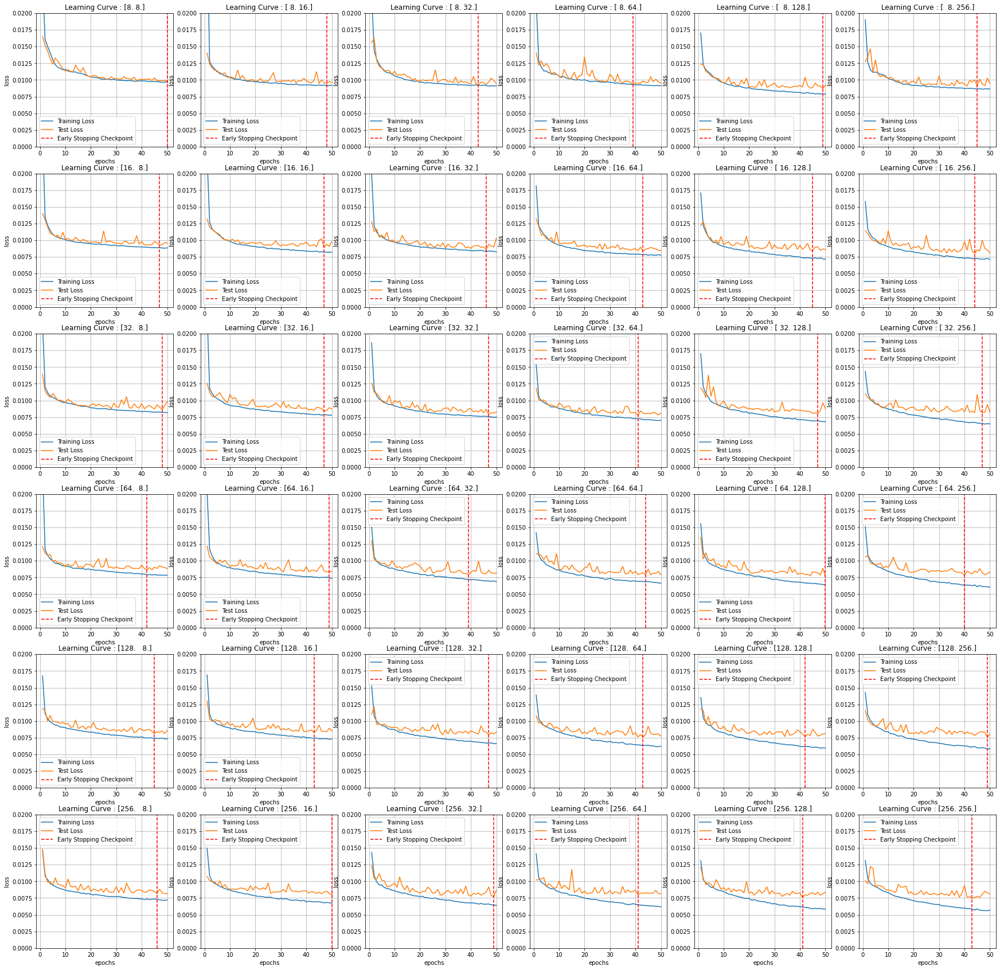

In [313]:
# Plot hyperNet Learning Curve

plt.figure(figsize=(30,30))

check_for_plot = 1
for i in range(iteration_num):
    for j in range(iteration_num):
        plt.subplot(iteration_num, iteration_num, check_for_plot)
        plt.plot(range(1,epoch_num+1), loss_train_follow[i][j], label='Training Loss')
        plt.plot(range(1,epoch_num+1), loss_test_follow[i][j], label='Test Loss')

        min_val_loss = loss_test_follow[i][j].index(min(loss_test_follow[i][j])) + 1
        plt.axvline(min_val_loss, linestyle='--', color='r', label='Early Stopping Checkpoint')

        plt.title("Learning Curve : {}".format(hidden_dim_set[i,j]))
        plt.xlabel("epochs")
        plt.ylabel("loss")
        plt.ylim(0,0.02)
        plt.grid(True)
        plt.legend()
        
        check_for_plot += 1

plt.show()

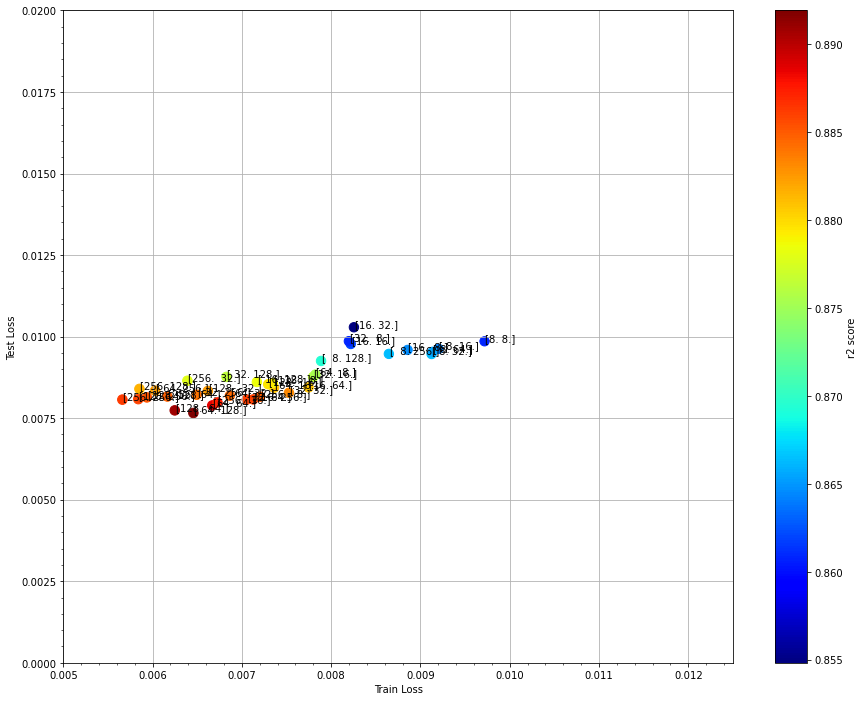

In [314]:
# Scatter Plot

plt.figure(figsize=(15,12))

plt.scatter(loss_train_hyper.flatten(), loss_test_hyper.flatten(), s=r2_train_hyper.flatten()*100, c=r2_test_hyper.flatten(), cmap='jet')
plt.colorbar(label='r2 score')

for i in range(iteration_num):
    for j in range(iteration_num):
        plt.annotate(hidden_dim_set[i,j], (loss_train_hyper[i,j]+1e-5, loss_test_hyper[i,j]+1e-5), fontsize=10)

plt.xlabel('Train Loss')
plt.ylabel('Test Loss')
plt.xlim(0.0050, 0.0125)
plt.ylim(0, 0.02)

plt.grid(True)
plt.minorticks_on()

plt.show()

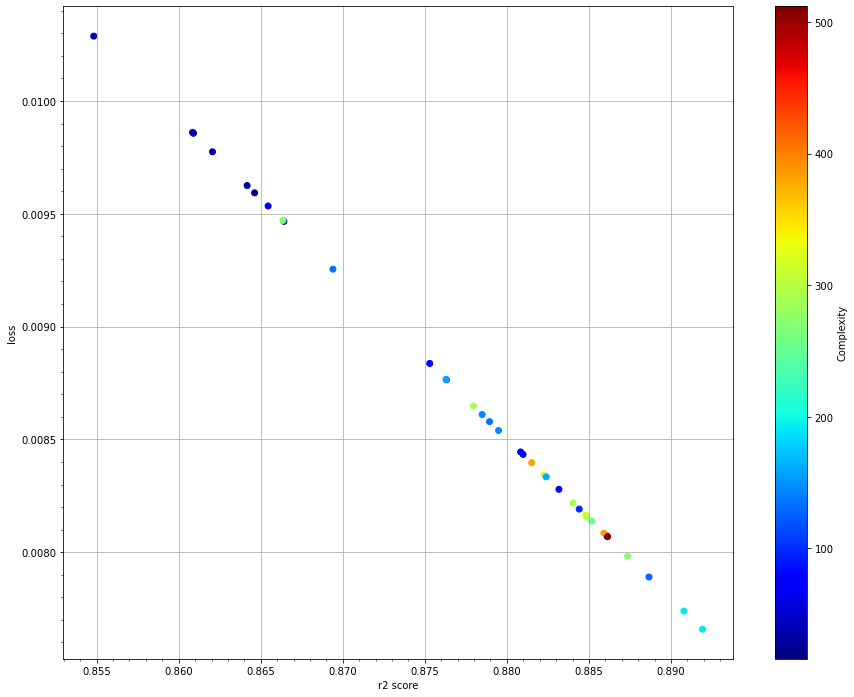

In [315]:
# Scatter Plot (only Testset)

plt.figure(figsize=(15,12))

plt.scatter(r2_test_hyper.flatten(), loss_test_hyper.flatten(), c=np.sum(hidden_dim_set, axis=2).flatten(), cmap='jet')
plt.colorbar(label='Complexity')

plt.xlabel('r2 score')
plt.ylabel('loss')

plt.grid(True)
plt.minorticks_on()

plt.show()

In [323]:
# Optimal Model Structure Determination

optim_hidden_dim = hidden_dim_set.reshape(-1,2)[np.argmin(loss_test_hyper)]
print (optim_hidden_dim)

[ 64. 128.]


### 2) Learning Rate / Weight Decay

In [326]:
# Learning Rate Tuning

lr_set = [1e-3, 1e-4, 1e-5, 1e-6]
decay_set = [1e-5, 1e-6, 1e-7, 0]
iteration_num = 4

In [327]:
# Model Training

loss_train_follow = [[0 for i in range(iteration_num)] for j in range(iteration_num)]
loss_train_hyper = np.zeros((iteration_num,iteration_num))
r2_train_hyper = np.zeros((iteration_num,iteration_num))

loss_test_follow = [[0 for i in range(iteration_num)] for j in range(iteration_num)]
loss_test_hyper = np.zeros((iteration_num,iteration_num))
r2_test_hyper = np.zeros((iteration_num,iteration_num))

time_start = time.time()

for i in range(iteration_num):
    for j in range(iteration_num):
        
        print ("\nTrain FNN with lr : {}, weight_decay : {}".format(lr_set[i], decay_set[j]))

        hyperNet = HyperFNN(input_dim=len(mol_properties),hidden_dim=optim_hidden_dim)
        criterion = nn.MSELoss()
        optimizer = optim.Adam(hyperNet.parameters(),lr=lr_set[i],weight_decay=decay_set[j])

        epoch_num = 50
        loss_train_epoch = []
        loss_test_epoch = []
        train_last_labels = torch.Tensor([])
        train_last_outputs = torch.Tensor([])
        test_last_labels = torch.Tensor([])
        test_last_outputs = torch.Tensor([])

        for epoch in range(epoch_num):

            running_loss = 0.0

            hyperNet.train()
            for data in train_loader:
                inputs, labels = data
                optimizer.zero_grad()
                outputs = hyperNet(inputs)
                loss = criterion(outputs, labels)
                loss.backward()
                optimizer.step()
                if epoch + 1 == epoch_num:
                    train_last_labels = torch.cat([train_last_labels, labels], dim=0)
                    train_last_outputs = torch.cat([train_last_outputs, outputs], dim=0)

                running_loss += loss.item() * labels.shape[0]
            
            loss_train_epoch.append(running_loss/len(X_trainset))

            running_loss = 0.0

            hyperNet.eval()
            with torch.no_grad():
                for data in test_loader:
                    inputs, labels = data
                    outputs = hyperNet(inputs)
                    loss = criterion(outputs, labels)
                    if epoch + 1 == epoch_num:
                        test_last_labels = torch.cat([test_last_labels, labels], dim=0)
                        test_last_outputs = torch.cat([test_last_outputs, outputs], dim=0)

                    running_loss += loss.item() * labels.shape[0]
            
            loss_test_epoch.append(running_loss/len(X_testset))

            if (epoch + 1) % 25 == 0:
                print('Epoch [{}/{}]\tTrain loss: {:.5f}\tTest loss: {:.5f}'.format(epoch + 1, epoch_num, loss_train_epoch[-1], loss_test_epoch[-1]))

        loss_train_follow[i][j] = (loss_train_epoch)
        loss_test_follow[i][j] = (loss_test_epoch)
        loss_train_hyper[i,j] = (loss_train_epoch[-1])
        loss_test_hyper[i,j] = (loss_test_epoch[-1])

        train_last_labels = sc_val.inverse_transform(train_last_labels.view(-1,1).detach().numpy()).reshape(-1)
        train_last_outputs = sc_val.inverse_transform(train_last_outputs.view(-1,1).detach().numpy()).reshape(-1)
        r2_train_hyper[i,j] = r2_score(train_last_labels, train_last_outputs)

        test_last_labels = sc_val.inverse_transform(test_last_labels.view(-1,1).detach().numpy()).reshape(-1)
        test_last_outputs = sc_val.inverse_transform(test_last_outputs.view(-1,1).detach().numpy()).reshape(-1)
        r2_test_hyper[i,j] = r2_score(test_last_labels, test_last_outputs)

        print('Train MSE: {:.5f}\tTrain R2 score: {:.5f}'.format(loss_train_hyper[i,j], r2_train_hyper[i,j]))
        print('Test MSE: {:.5f}\tTest R2 score: {:.5f}'.format(loss_test_hyper[i,j], r2_test_hyper[i,j]))

print ("\nTraining Finished, Time :", time.time()-time_start)


Train FNN with lr : 0.001, weight_decay : 1e-05
Epoch [25/50]	Train loss: 0.00775	Test loss: 0.00853
Epoch [50/50]	Train loss: 0.00703	Test loss: 0.00834
Train MSE: 0.00703	Train R2 score: 0.89966
Test MSE: 0.00834	Test R2 score: 0.88227

Train FNN with lr : 0.001, weight_decay : 1e-06
Epoch [25/50]	Train loss: 0.00734	Test loss: 0.00843
Epoch [50/50]	Train loss: 0.00635	Test loss: 0.00975
Train MSE: 0.00635	Train R2 score: 0.90939
Test MSE: 0.00975	Test R2 score: 0.86240

Train FNN with lr : 0.001, weight_decay : 1e-07
Epoch [25/50]	Train loss: 0.00728	Test loss: 0.00849
Epoch [50/50]	Train loss: 0.00630	Test loss: 0.00801
Train MSE: 0.00630	Train R2 score: 0.91000
Test MSE: 0.00801	Test R2 score: 0.88693

Train FNN with lr : 0.001, weight_decay : 0
Epoch [25/50]	Train loss: 0.00713	Test loss: 0.00907
Epoch [50/50]	Train loss: 0.00622	Test loss: 0.00849
Train MSE: 0.00622	Train R2 score: 0.91120
Test MSE: 0.00849	Test R2 score: 0.88017

Train FNN with lr : 0.0001, weight_decay : 1e-0

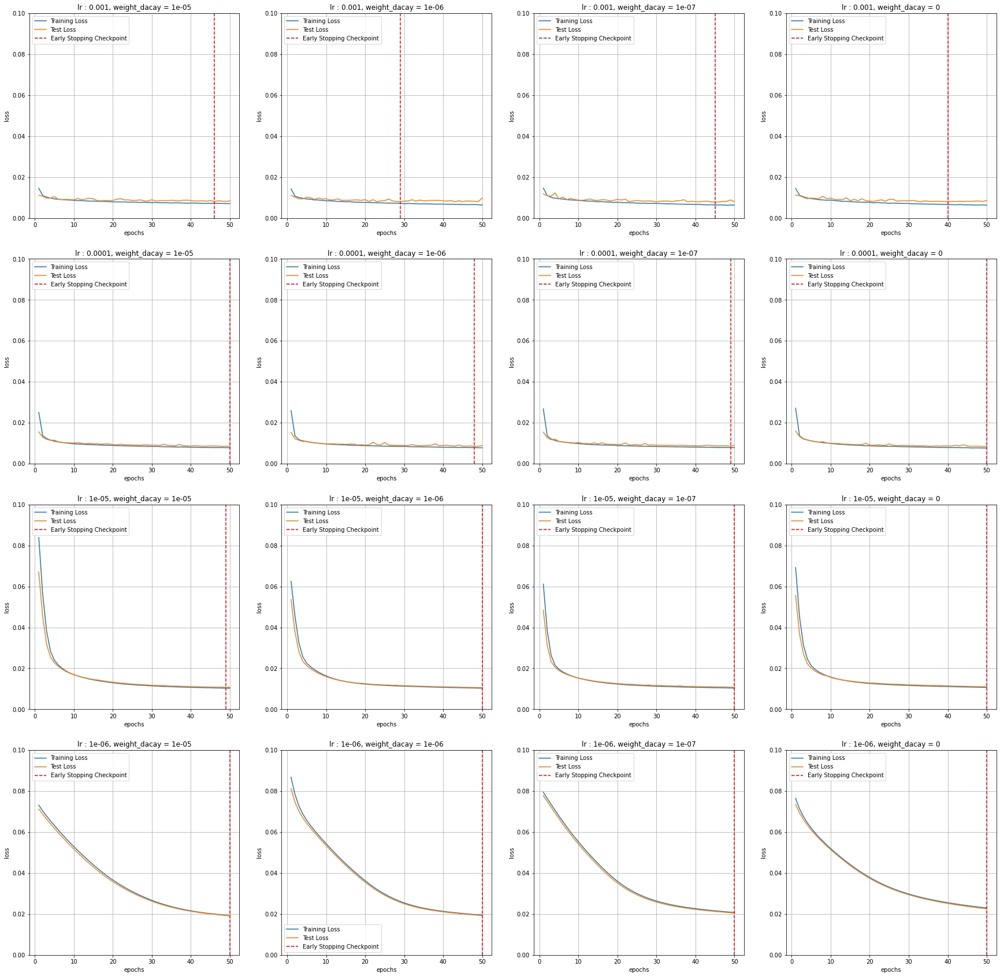

In [332]:
# Plot hyperNet Learning Curve

plt.figure(figsize=(30,30))

check_for_plot = 1
for i in range(iteration_num):
    for j in range(iteration_num):
        plt.subplot(iteration_num, iteration_num, check_for_plot)
        plt.plot(range(1,epoch_num+1), loss_train_follow[i][j], label='Training Loss')
        plt.plot(range(1,epoch_num+1), loss_test_follow[i][j], label='Test Loss')

        min_val_loss = loss_test_follow[i][j].index(min(loss_test_follow[i][j])) + 1
        plt.axvline(min_val_loss, linestyle='--', color='r', label='Early Stopping Checkpoint')

        plt.title("lr : {}, weight_dacay = {}".format(lr_set[i], decay_set[j]))
        plt.xlabel("epochs")
        plt.ylabel("loss")
        plt.ylim(0,0.1)
        plt.grid(True)
        plt.legend()
        
        check_for_plot += 1

plt.show()

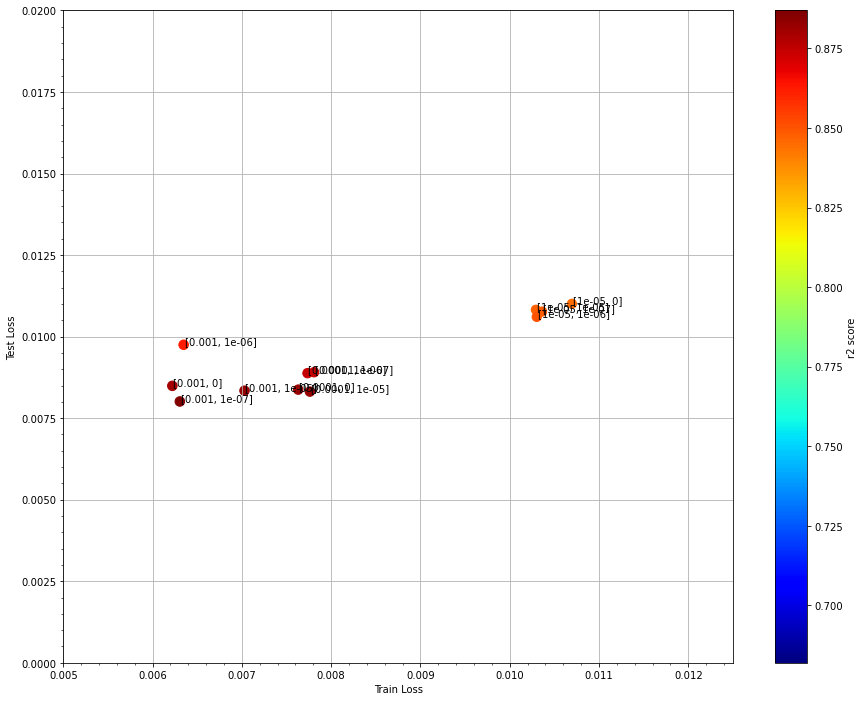

In [333]:
# Scatter Plot

plt.figure(figsize=(15,12))

plt.scatter(loss_train_hyper.flatten(), loss_test_hyper.flatten(), s=r2_train_hyper.flatten()*100, c=r2_test_hyper.flatten(), cmap='jet')
plt.colorbar(label='r2 score')

for i in range(iteration_num):
    for j in range(iteration_num):
        plt.annotate([lr_set[i],decay_set[j]], (loss_train_hyper[i,j]+1e-5, loss_test_hyper[i,j]+1e-5), fontsize=10)

plt.xlabel('Train Loss')
plt.ylabel('Test Loss')
plt.xlim(0.0050, 0.0125)
plt.ylim(0, 0.02)

plt.grid(True)
plt.minorticks_on()

plt.show()

In [337]:
# Optimal Hyperparameter (lr, weight_decay) Determination

optim_lr_decay = np.argwhere(loss_test_hyper == np.min(loss_test_hyper))
print (optim_lr_decay)

optim_lr = lr_set[optim_lr_decay[0][0]]
optim_decay = decay_set[optim_lr_decay[0][1]]
print (optim_lr, optim_decay)

[[0 2]]
0.001 1e-07


## 4. Final Model Training + Early Stopping Implementation

In [341]:
class OptFNN(nn.Module):
    def __init__(self, input_dim, hidden_dim):
        super(OptFNN, self).__init__()
        self.fc1 = nn.Linear(input_dim, int(hidden_dim[0]))
        self.fc2 = nn.Linear(int(hidden_dim[0]), int(hidden_dim[1])) 
        self.fc3 = nn.Linear(int(hidden_dim[1]), 1)
        
    def forward(self, x):
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x.view(-1)

In [418]:
# Model Training

time_start = time.time()
        
print ("\nTrain Optimal FNN")

optNet = OptFNN(input_dim=len(mol_properties),hidden_dim=optim_hidden_dim)
criterion = nn.MSELoss()
optimizer = optim.Adam(optNet.parameters(),lr=optim_lr,weight_decay=optim_decay)

epoch_num = 200
earlystop_epoch_num = 30
epoch_no_improve = 0
min_loss_test = 1
early_stop = True
optim_epoch = -1
loss_train_epoch = []
loss_test_epoch = []

for epoch in range(epoch_num):

    if early_stop:
        if epoch + 1 == epoch_num:
            optim_epoch = epoch
            torch.save(optNet.state_dict(), './data/fnn_state_dict.pt')
            print ("\tSave the model.")
        elif epoch > 1:
            if loss_test_epoch[-1] > min_loss_test:
                epoch_no_improve += 1
                print ("")
            else:
                epoch_no_improve = 0
                min_loss_test = loss_test_epoch[-1]
                optim_epoch = epoch-1
                torch.save(optNet.state_dict(), './data/fnn_state_dict.pt')
                print ("\tSave the model.")
            if epoch_no_improve == earlystop_epoch_num:
                print ("\nEarly Stopping!")
                print ("Training Finished, Time :", time.time()-time_start)
                print ("Continue Calculation...\n")
                early_stop = False
                # break
        else:
            print ("")
    else:
        print ("")
    
    if early_stop:
        train_last_labels = torch.Tensor([])
        train_last_outputs = torch.Tensor([])
        test_last_labels = torch.Tensor([])
        test_last_outputs = torch.Tensor([])

    running_loss = 0.0

    optNet.train()
    for data in train_loader:
        inputs, labels = data
        optimizer.zero_grad()
        outputs = optNet(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        if early_stop:
            train_last_labels = torch.cat([train_last_labels, labels], dim=0)
            train_last_outputs = torch.cat([train_last_outputs, outputs], dim=0)

        running_loss += loss.item() * labels.shape[0]
    
    loss_train_epoch.append(running_loss/len(X_trainset))

    running_loss = 0.0

    optNet.eval()
    with torch.no_grad():
        for data in test_loader:
            inputs, labels = data
            outputs = optNet(inputs)
            loss = criterion(outputs, labels)
            if early_stop:
                test_last_labels = torch.cat([test_last_labels, labels], dim=0)
                test_last_outputs = torch.cat([test_last_outputs, outputs], dim=0)

            running_loss += loss.item() * labels.shape[0]
    
    loss_test_epoch.append(running_loss/len(X_testset))

    print('Epoch [{}/{}]\tTrain loss: {:.5f}\tTest loss: {:.5f}'.format(epoch + 1, epoch_num, loss_train_epoch[-1], loss_test_epoch[-1]), end='')

train_last_labels = sc_val.inverse_transform(train_last_labels.view(-1,1).detach().numpy()).reshape(-1)
train_last_outputs = sc_val.inverse_transform(train_last_outputs.view(-1,1).detach().numpy()).reshape(-1)
r2_train = r2_score(train_last_labels, train_last_outputs)

test_last_labels = sc_val.inverse_transform(test_last_labels.view(-1,1).detach().numpy()).reshape(-1)
test_last_outputs = sc_val.inverse_transform(test_last_outputs.view(-1,1).detach().numpy()).reshape(-1)
r2_test = r2_score(test_last_labels, test_last_outputs)

print ("")
print('Train MSE: {:.5f}\tTrain R2 score: {:.5f}'.format(loss_train_epoch[optim_epoch], r2_train))
print('Test MSE: {:.5f}\tTest R2 score: {:.5f}'.format(loss_test_epoch[optim_epoch], r2_test))

print ("\nCalculation Finished, Time :", time.time()-time_start)


Train Optimal FNN

Epoch [1/200]	Train loss: 0.01488	Test loss: 0.01098
Epoch [2/200]	Train loss: 0.01058	Test loss: 0.01121	Save the model.
Epoch [3/200]	Train loss: 0.01006	Test loss: 0.01108	Save the model.
Epoch [4/200]	Train loss: 0.00972	Test loss: 0.01049	Save the model.
Epoch [5/200]	Train loss: 0.00938	Test loss: 0.00979	Save the model.
Epoch [6/200]	Train loss: 0.00935	Test loss: 0.01081
Epoch [7/200]	Train loss: 0.00918	Test loss: 0.00936	Save the model.
Epoch [8/200]	Train loss: 0.00893	Test loss: 0.00890	Save the model.
Epoch [9/200]	Train loss: 0.00879	Test loss: 0.00888	Save the model.
Epoch [10/200]	Train loss: 0.00864	Test loss: 0.01002
Epoch [11/200]	Train loss: 0.00854	Test loss: 0.00900
Epoch [12/200]	Train loss: 0.00839	Test loss: 0.00920
Epoch [13/200]	Train loss: 0.00828	Test loss: 0.00865	Save the model.
Epoch [14/200]	Train loss: 0.00819	Test loss: 0.00903
Epoch [15/200]	Train loss: 0.00814	Test loss: 0.00873
Epoch [16/200]	Train loss: 0.00805	Test loss: 0.008

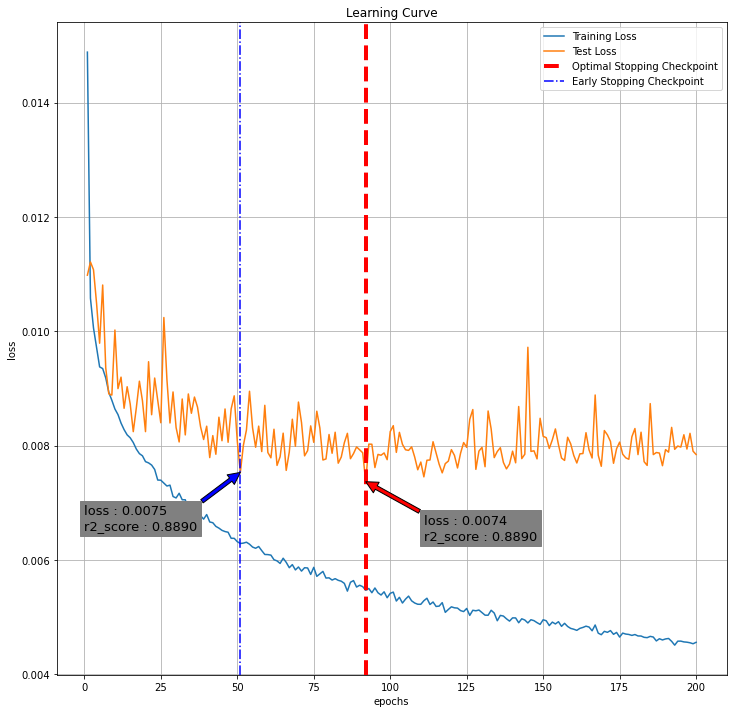

In [419]:
# Plot Learning Curve to check overfitting

plt.figure(figsize=(12,12))
plt.plot(range(1,epoch_num+1), loss_train_epoch, label='Training Loss')
plt.plot(range(1,epoch_num+1), loss_test_epoch, label='Test Loss')

min_val_loss = loss_test_epoch.index(min(loss_test_epoch))
plt.axvline(min_val_loss + 1, linestyle='--', linewidth=4, color='r', label='Optimal Stopping Checkpoint')
plt.axvline(optim_epoch + 1, linestyle='-.', color='b', label='Early Stopping Checkpoint')

plt.annotate('loss : {:.4f}\nr2_score : {:.4f}'.format(loss_test_epoch[min_val_loss], r2_test), xy=[min_val_loss+1, loss_test_epoch[min_val_loss]], xytext=[min_val_loss+20, loss_test_epoch[min_val_loss]-1e-3], bbox=dict(boxstyle='square', color='grey'),fontsize=13, arrowprops=dict(facecolor='red'))
plt.annotate('loss : {:.4f}\nr2_score : {:.4f}'.format(loss_test_epoch[optim_epoch], r2_test), xy=[optim_epoch+1, loss_test_epoch[optim_epoch]], xytext=[optim_epoch-50, loss_test_epoch[optim_epoch]-1e-3], bbox=dict(boxstyle='square', color='grey'),fontsize=13, arrowprops=dict(facecolor='blue'))

plt.title("Learning Curve")
plt.xlabel("epochs")
plt.ylabel("loss")
plt.grid(True)
plt.legend()
plt.show()

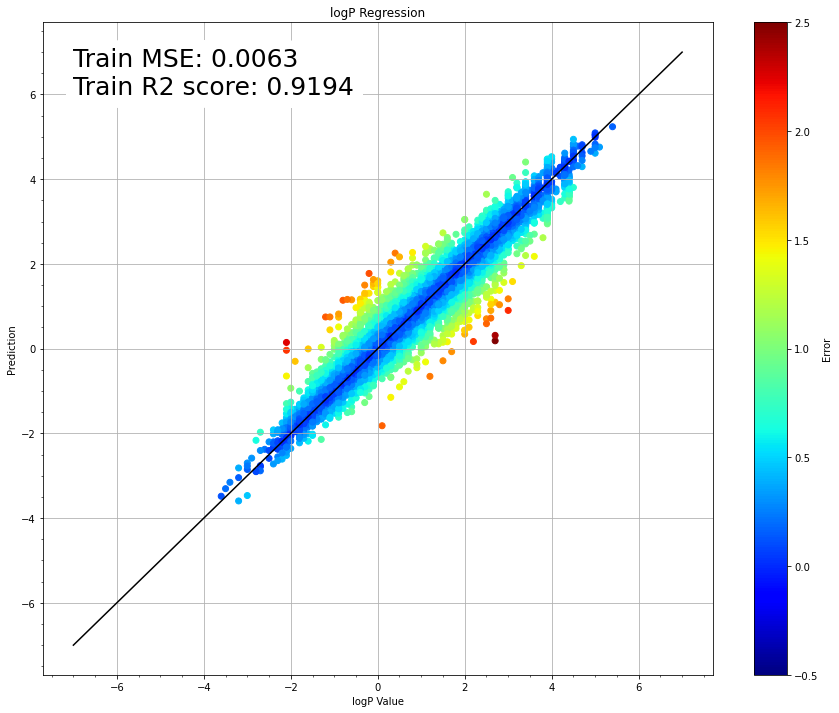

In [420]:
# Train Set Fitting

plt.figure(figsize=(15,12))

plt.plot([-7,7],[-7,7],color='black')
plt.scatter(train_last_labels, train_last_outputs, c=np.abs(train_last_labels -train_last_outputs), vmax=2.5, vmin=-0.5, cmap='jet')
plt.colorbar(label='Error')

plt.title('logP Regression')
plt.xlabel('logP Value')
plt.ylabel('Prediction')

boxset = {'boxstyle':'square', 'ec':(1,1,1),'fc':(1,1,1), 'linestyle':'--', 'color':'black'}
plt.text(-7, 6, 'Train MSE: {:.4f}\nTrain R2 score: {:.4f}'.format(loss_train_epoch[optim_epoch], r2_train), fontsize=25, bbox=boxset)

plt.grid(True)
plt.minorticks_on()

plt.show()

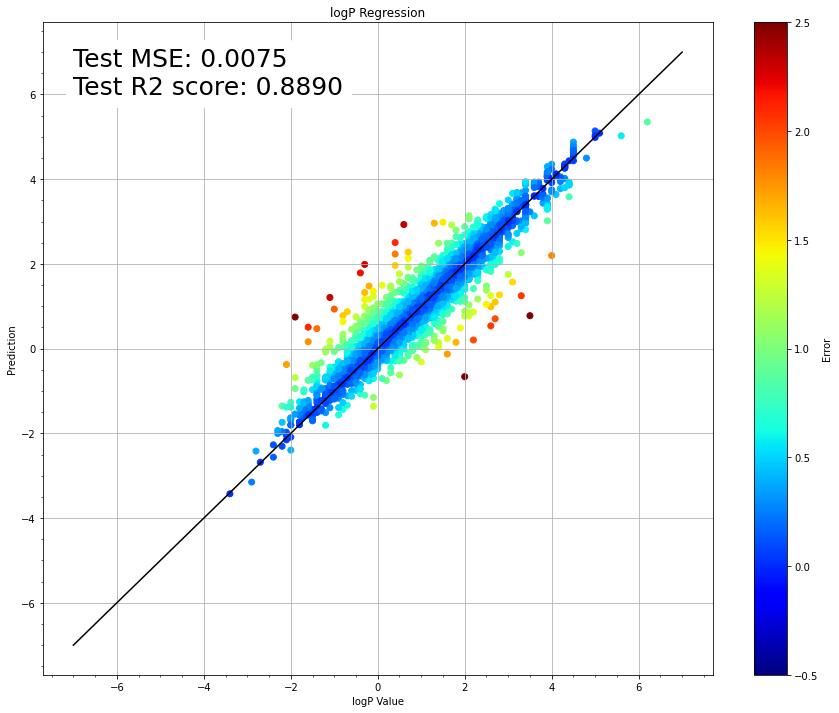

In [421]:
# Test Set Fitting

plt.figure(figsize=(15,12))

plt.plot([-7,7],[-7,7],color='black')
plt.scatter(test_last_labels, test_last_outputs, c=np.abs(test_last_labels -test_last_outputs), vmax=2.5, vmin=-0.5, cmap='jet')
plt.colorbar(label='Error')

plt.title('logP Regression')
plt.xlabel('logP Value')
plt.ylabel('Prediction')

boxset = {'boxstyle':'square', 'ec':(1,1,1),'fc':(1,1,1), 'linestyle':'--', 'color':'black'}
plt.text(-7, 6, 'Test MSE: {:.4f}\nTest R2 score: {:.4f}'.format(loss_test_epoch[optim_epoch], r2_test), fontsize=25, bbox=boxset)

plt.grid(True)
plt.minorticks_on()

plt.show()

## 5. Model Save & Load

In [447]:
# Model Load Check

loadNet = OptFNN(input_dim=len(mol_properties),hidden_dim=optim_hidden_dim)
criterion = nn.MSELoss()
optimizer = optim.Adam(loadNet.parameters(),lr=optim_lr,weight_decay=optim_decay)

loadNet.load_state_dict(torch.load('./data/fnn_state_dict.pt'))

loadNet.eval()

with torch.no_grad():

    load_test_outputs = torch.Tensor([])
    load_test_labels = torch.Tensor([])
    load_test_loss_list = []
    running_loss = 0.0

    for data in test_individual_loader:
        inputs, labels = data
        outputs = loadNet(inputs)
        loss = criterion(outputs, labels)
        load_test_outputs = torch.cat([load_test_outputs, outputs], dim=0)
        load_test_labels = torch.cat([load_test_labels, labels], dim=0)
        running_loss += loss.item() * labels.shape[0]
        load_test_loss_list.append(loss.item())

    load_test_outputs = sc_val.inverse_transform(load_test_outputs.view(-1,1).numpy()).reshape(-1)
    load_test_labels = sc_val.inverse_transform(load_test_labels.view(-1,1).numpy()).reshape(-1)
    load_test_r2 = r2_score(load_test_outputs, load_test_labels)
    load_test_loss = running_loss/len(X_testset)

    print('Test MSE: {:.5f}\tTest R2 score: {:.5f}'.format(load_test_loss, load_test_r2))

Test MSE: 0.00753	Test R2 score: 0.88589


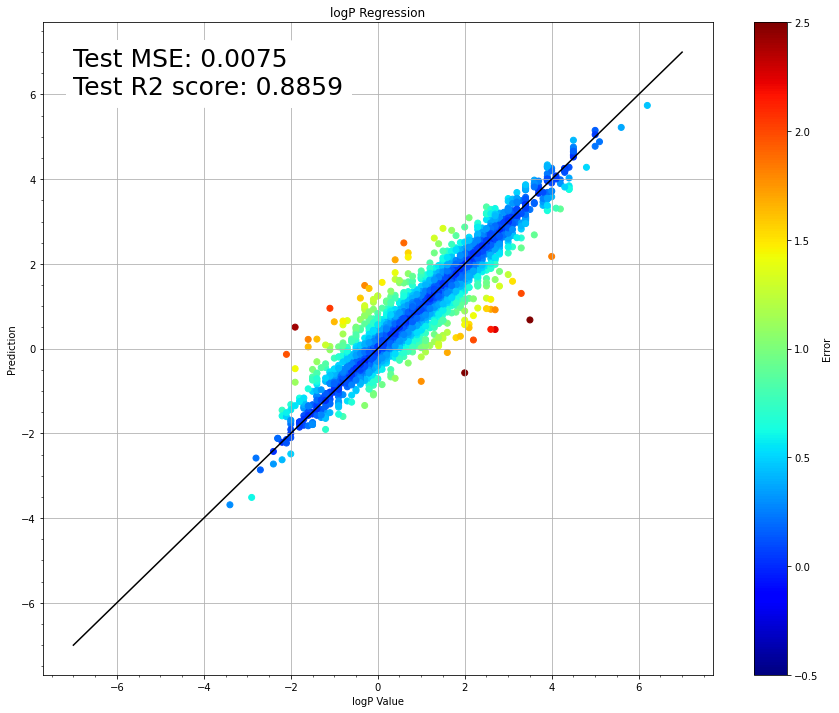

In [444]:
# Test Set Fitting

plt.figure(figsize=(15,12))

plt.plot([-7,7],[-7,7],color='black')
plt.scatter(load_test_labels, load_test_outputs, c=np.abs(load_test_labels -load_test_outputs), vmax=2.5, vmin=-0.5, cmap='jet')
plt.colorbar(label='Error')

plt.title('logP Regression')
plt.xlabel('logP Value')
plt.ylabel('Prediction')

boxset = {'boxstyle':'square', 'ec':(1,1,1),'fc':(1,1,1), 'linestyle':'--', 'color':'black'}
plt.text(-7, 6, 'Test MSE: {:.4f}\nTest R2 score: {:.4f}'.format(load_test_loss, load_test_r2), fontsize=25, bbox=boxset)

plt.grid(True)
plt.minorticks_on()

plt.show()

Rank 1 : logP = 3.5, Expected = 0.6777272820472717
Rank 2 : logP = 2.0, Expected = -0.5711252093315125
Rank 3 : logP = -1.899999976158142, Expected = 0.5079248547554016
Rank 4 : logP = 2.700000286102295, Expected = 0.45145663619041443
Rank 5 : logP = 2.5999999046325684, Expected = 0.4554811120033264
Rank 6 : logP = -1.100000023841858, Expected = 0.9527232050895691
Rank 7 : logP = 3.3000001907348633, Expected = 1.3041175603866577
Rank 8 : logP = 2.200000047683716, Expected = 0.20437459647655487
Rank 9 : logP = -2.1000001430511475, Expected = -0.13493923842906952


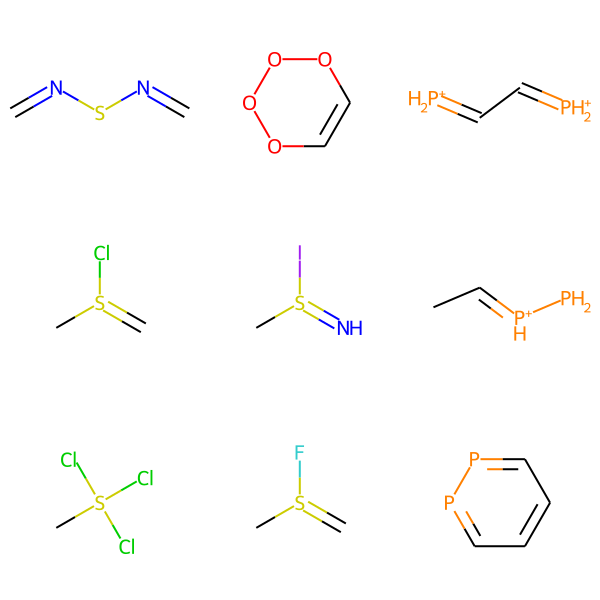

In [488]:
# Check Max Loss Molecule

smiles_loss_idx = []
for i in range(9):
    smiles_idx = load_test_loss_list.index(sorted(load_test_loss_list, reverse=True)[i])
    smiles = test_smiles[smiles_idx]
    smiles_loss_idx.append(Chem.MolFromSmiles(smiles))
    print ("Rank {} : logP = {}, Expected = {}".format(i+1, load_test_labels[smiles_idx], load_test_outputs[smiles_idx]))
Chem.Draw.MolsToGridImage(smiles_loss_idx)
